In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import rc_context
from multiprocessing import Pool
sc.settings.verbosity = 1

#sc.logging.print_versions()

import os 
import sys
import gc
import importlib

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'
sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
sns.set_style('white', {'axes.grid' : False})

sys.path.append('/home/lee/project/scanpy_func/')
sys.path.append('/home/lee/project/spatialSNV/codes/')

import scanpy_func as sf
import spatialSNV as ss

def vector(on=False):
    if on:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=False)
    else:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
vector(False)

# hotspot

In [2]:
import hotspot

In [4]:
# adata = sc.read_h5ad('tb_bin50_harmony_smooth_rmlow.h5ad')
raw = sc.read_h5ad('tb_bin50_raw.h5ad')
raw

AnnData object with n_obs × n_vars = 312068 × 52933
    obs: 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'orig.ident', 'x', 'y', 'sample', 'chip', 'time', 'total_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'
    obsm: 'X_umap', 'spatial'

In [9]:
adata = adata[:, adata.var['n_cells_by_counts']>=100]
adata.layers['counts'] = raw[adata.obs_names, adata.var_names].X
adata.layers['counts'].data

array([1., 1., 1., ..., 1., 2., 1.], dtype=float32)

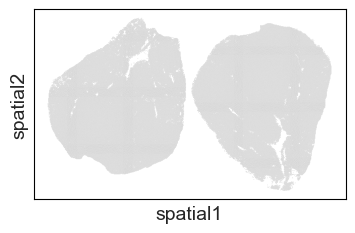

In [10]:
w8 = adata[adata.obs['time']=='8w']
sc.pl.spatial(w8, spot_size=60)

In [90]:
hs = hotspot.Hotspot(
    w8,
    layer_key="counts",
    model='danb',
    latent_obsm_key="spatial",
    umi_counts_obs_key="total_counts"
)

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/hotspot/hotspot.py:98: UserWarning: Hotspot will work faster when counts are a csc sparse matrix.
  warnings.warn(


In [91]:
hs.create_knn_graph(weighted_graph=True, n_neighbors=30)

In [92]:
hs_results = hs.compute_autocorrelations(jobs=30)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33520/33520 [1:01:36<00:00,  9.07it/s]


In [93]:
# Select the genes with significant spatial autocorrelation
hs_genes = hs_results.index[hs_results.FDR < 0.01]
print(len(hs_genes))

1859


In [94]:
# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=30)

Computing pair-wise local correlation on 1859 features...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1727011/1727011 [1:10:34<00:00, 407.85it/s]


In [95]:
import copy
hs_8w = copy.deepcopy(hs)

In [96]:
# sys.setrecursionlimit(10000)

modules = hs_8w.create_modules(
    min_gene_threshold=20, core_only=False, fdr_threshold=0.01
)

modules.value_counts()

-1     586
 1     307
 6     231
 2     218
 7     109
 5      87
 8      74
 4      68
 9      66
 3      46
 11     35
 10     32
Name: Module, dtype: int64

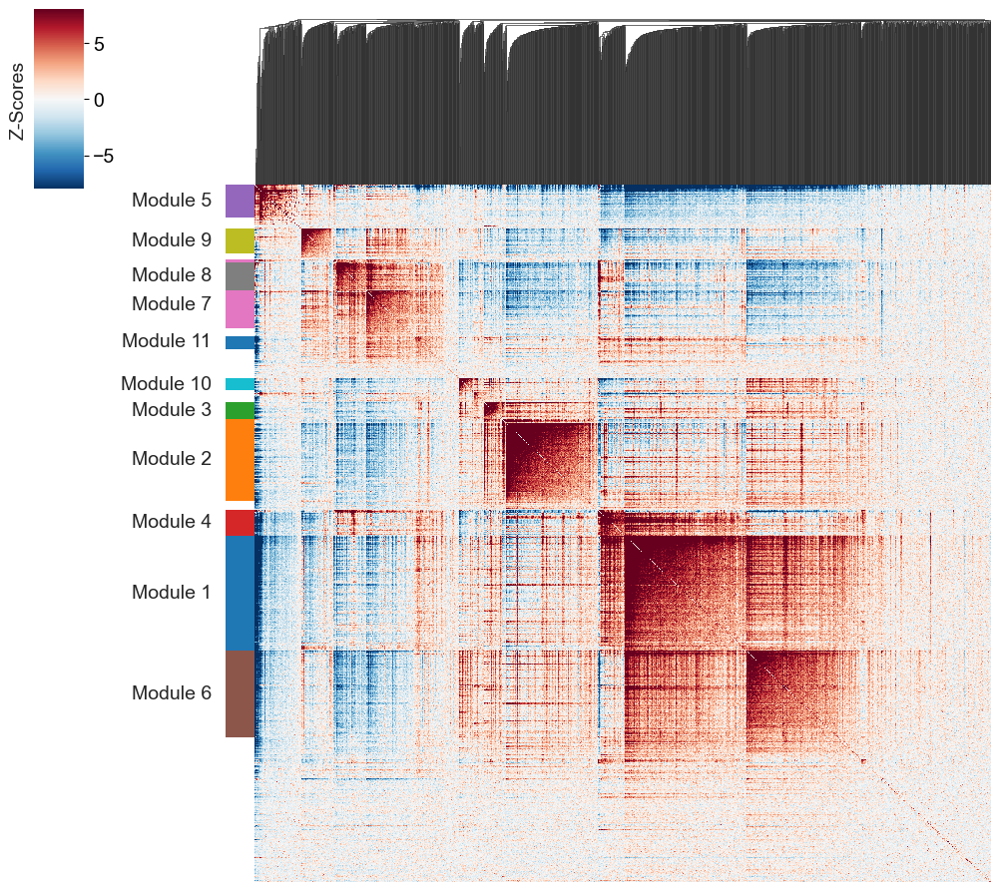

In [97]:
hs_8w.plot_local_correlations()
# plt.savefig('8w_hs.pdf')

In [99]:
module_scores = hs_8w.calculate_module_scores()
module_scores.index = w8.obs_names

Computing scores for 11 modules...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:21<00:00,  7.41s/it]


computing score 'score'


/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


    finished: added
    'score', score of gene set (adata.obs).
    250 total control genes are used. (0:00:02)


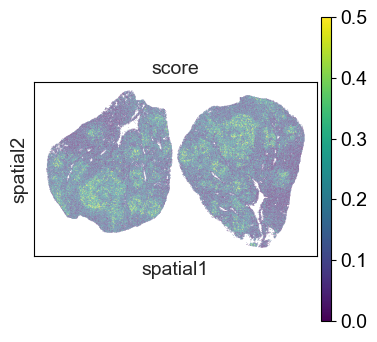

In [24]:
genes = modules[modules==8].index

sc.tl.score_genes(w8, gene_list=genes)
sc.pl.spatial(w8, spot_size=50, color='score', vmin=0, vmax=0.5, cmap='viridis')

In [100]:
module_cols = []
for c in module_scores.columns:
    key = f"Module_{c}"
    w8.obs[key] = hs_8w.module_scores[c]
    module_cols.append(key)

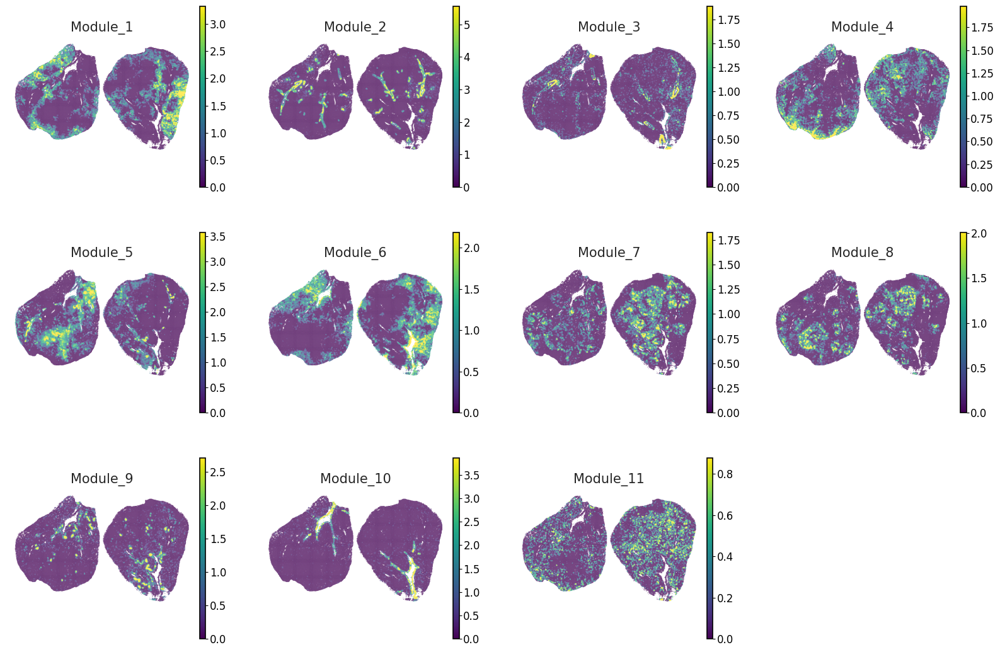

In [103]:
import matplotlib.colors as colors
import mplscience

with mplscience.style_context():
    sc.pl.spatial(w8, color=module_cols, frameon=False, vmax="p99", vmin=0,
                  spot_size=60, save='w8_modules.pdf', cmap='viridis')

In [70]:
modules['Rvnr02']

4

In [71]:
modules.to_csv('modules_w22.csv')

In [31]:
modules.to_csv('modules_8w.csv')

In [105]:
import pickle
with open('8w_hs.pkl', 'wb') as f:
    pickle.dump(hs_8w, f)

# w4

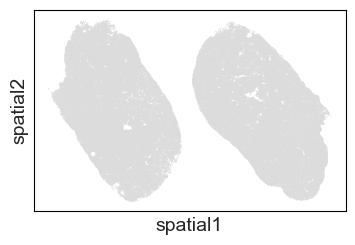

In [34]:
w4 = adata[adata.obs['time']=='4W']
sc.pl.spatial(w4, spot_size=60)

In [37]:
w4 = sf.sc_qc(w4, sc_cal=True, min_cells=10)
w4

/home/lee/project/scanpy_func/scanpy_func.py:197: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('mt-')


filtered out 230 genes that are detected in less than 10 cells


AnnData object with n_obs × n_vars = 87617 × 33290
    obs: 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'orig.ident', 'x', 'y', 'sample', 'chip', 'time', 'total_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'n_genes', 'harmony_leiden', 'x2', 'y2', 'top_region_cluster', 'leiden', 'cluster6', 'region', 'tb'
    var: 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    uns: 'harmony_leiden_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'region_colors', 'sample_colors', 'top_region_cluster', 'top_region_cluster_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_harmony_smooth', 'X_umap', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'top_region_cluster_connectivities', 'top_region_cluster_distances'

In [38]:
hs_w4 = hotspot.Hotspot(
    w4,
    layer_key="counts",
    model='danb',
    latent_obsm_key="spatial",
    umi_counts_obs_key="total_counts"
)

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/hotspot/hotspot.py:98: UserWarning: Hotspot will work faster when counts are a csc sparse matrix.
  warnings.warn(


In [39]:
hs_w4.create_knn_graph(weighted_graph=True, n_neighbors=30)

In [40]:
hs_results = hs_w4.compute_autocorrelations(jobs=30)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33290/33290 [26:43<00:00, 20.76it/s]


In [41]:
# Select the genes with significant spatial autocorrelation
hs_genes = hs_results.index[hs_results.FDR < 0.01]
print(len(hs_genes))

589


In [59]:
# Compute pair-wise local correlations between these genes
lcz = hs_w4.compute_local_correlations(hs_genes, jobs=30)

Computing pair-wise local correlation on 589 features...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 173166/173166 [04:29<00:00, 643.22it/s]


In [60]:
# sys.setrecursionlimit(10000)

modules = hs_w4.create_modules(
    min_gene_threshold=20, core_only=False, fdr_threshold=0.01
)

modules.value_counts()

-1    386
 2     71
 3     63
 1     41
 4     28
Name: Module, dtype: int64

In [69]:
module_scores = hs_w4.calculate_module_scores()
module_scores.index = hs_w4.adata.obs_names

Computing scores for 4 modules...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.23s/it]


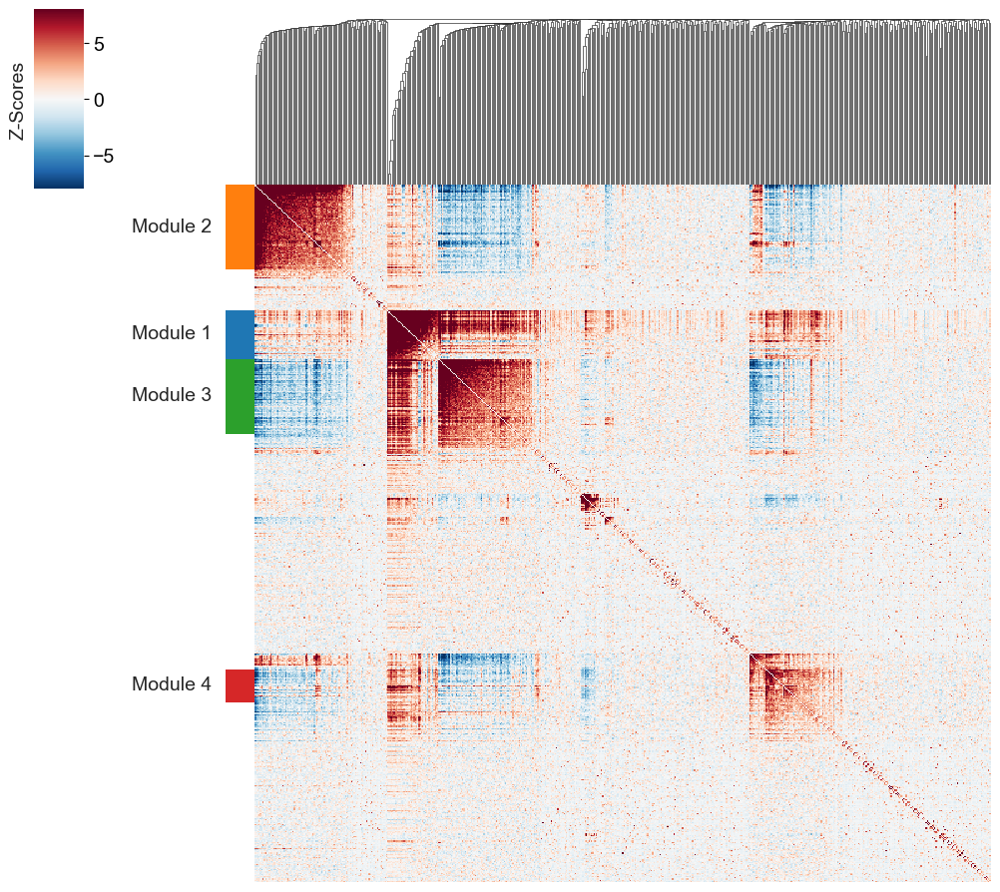

In [65]:
hs_w4.plot_local_correlations()
plt.savefig('4w_hs.pdf')

In [70]:
module_cols = []
for c in module_scores.columns:
    key = f"Module_{c}"
    w4.obs[key] = module_scores[c]
    module_cols.append(key)

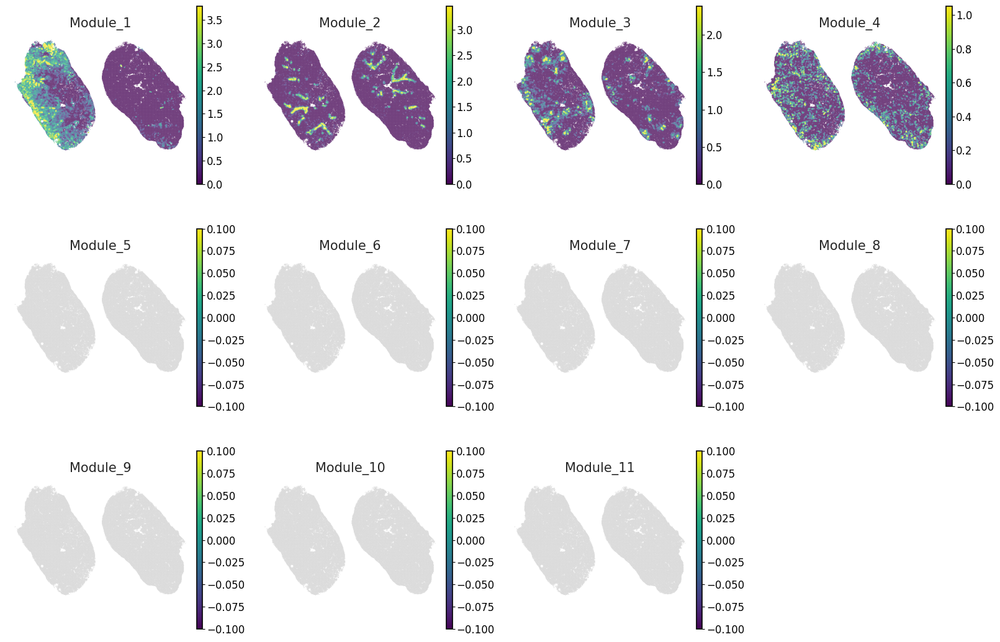

In [104]:
import matplotlib.colors as colors
import mplscience

with mplscience.style_context():
    sc.pl.spatial(w4, color=module_cols, frameon=False, vmin=0, vmax="p99", 
                  spot_size=60, save='w4_modules.pdf', cmap='viridis')

In [74]:
modules.to_csv('modules_4w.csv')

In [106]:
import pickle
with open('4w_hs.pkl', 'wb') as f:
    pickle.dump(hs_w4, f)

# plot

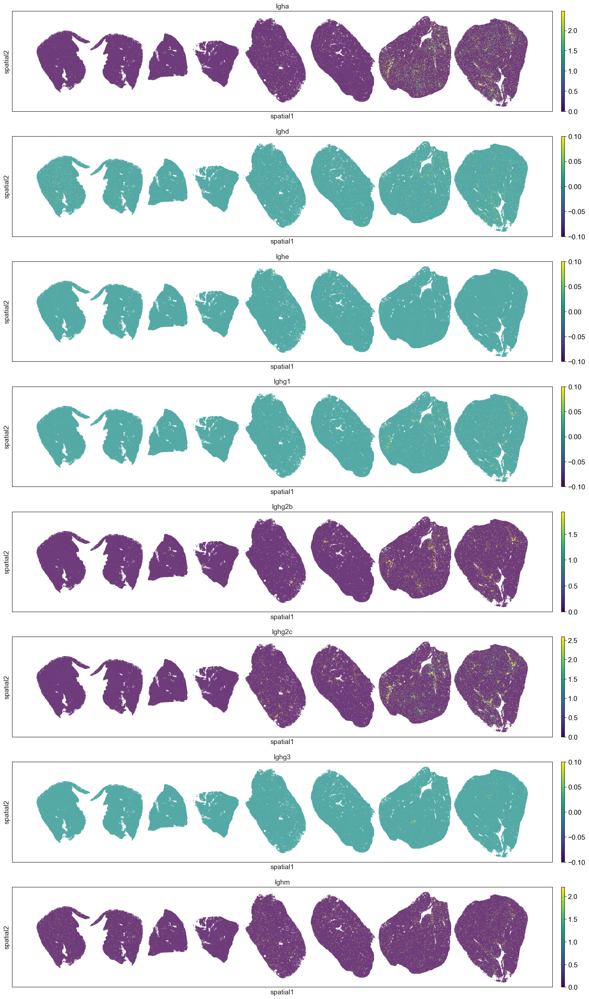

In [108]:
genes = ['Igha',
 'Ighd',
 'Ighe',
 'Ighg1',
 'Ighg2b',
 'Ighg2c',
 'Ighg3',
 'Ighm']
with rc_context(rc={'figure.figsize': (30, 4)}):
    sc.pl.spatial(adata, color=genes, spot_size=60, vmax='p99', cmap='viridis', save='igc.pdf', ncols=1)

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


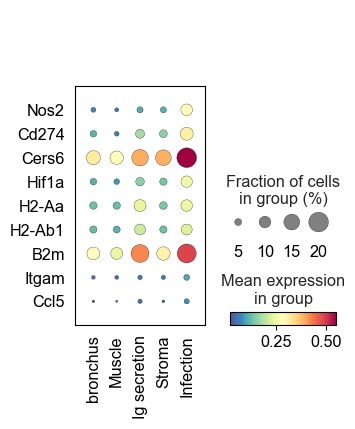

In [149]:
genes = ['Nos2', 'Cd274', 'Cers6', 'Hif1a'] + ['H2-Aa', 'H2-Ab1', 'B2m', 'Itgam', 'Ccl5']
sc.pl.dotplot(adata, var_names=genes, groupby='region', cmap='Spectral_r', categories_order=['bronchus', 'Muscle', 'Ig secretion', 'Stroma','Infection' ], 
              dot_max=0.2, swap_axes=True, save='region_genes.pdf')

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


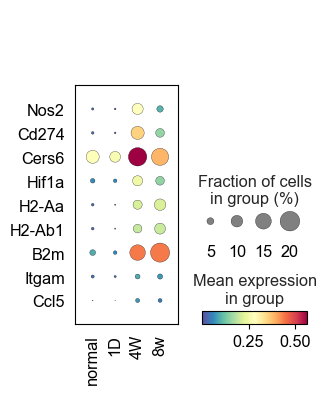

In [150]:
genes = ['Nos2', 'Cd274', 'Cers6', 'Hif1a'] + ['H2-Aa', 'H2-Ab1', 'B2m', 'Itgam', 'Ccl5']
sc.pl.dotplot(adata, var_names=genes, groupby='time', cmap='Spectral_r', swap_axes=True, save='time_genes.pdf')

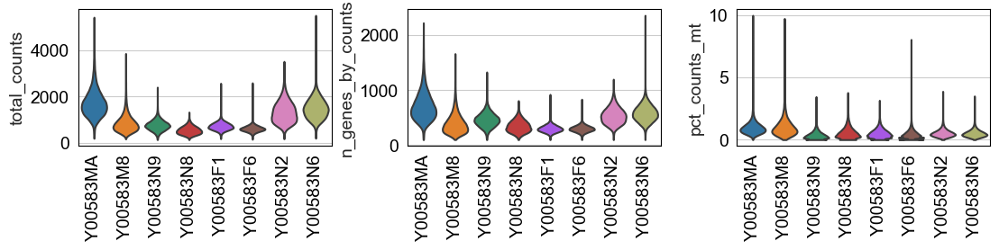

In [157]:
with rc_context(rc={'figure.figsize': (4, 2)}):
    sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts', 'pct_counts_mt' ], groupby='sample', rotation=90, stripplot=False, save='qc.pdf')

In [169]:
tmp = hs_8w.modules[hs_8w.modules==5]
tmp2 = [x for x in tmp.index if x.startswith('Ig')]
c = [x for x in tmp2 if 'v' not in x]

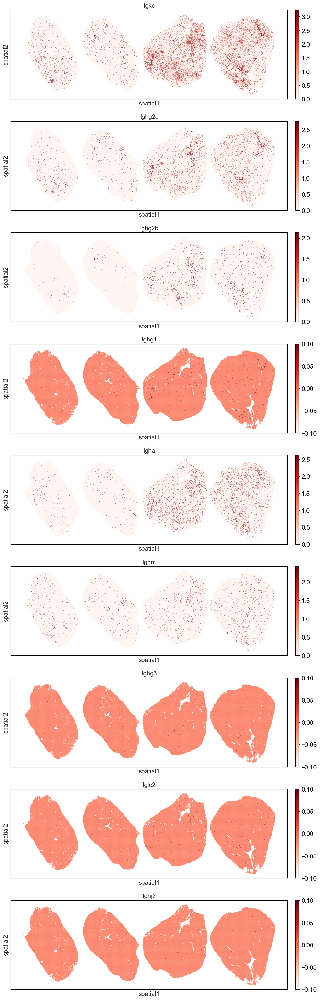

In [172]:
tmp = adata[adata.obs['time'].isin(['4W', '8w'])]
with rc_context(rc={'figure.figsize': (30, 4)}):
    sc.pl.spatial(tmp, color=c, spot_size=60, vmax='p99', cmap='Reds', ncols=1, save='igc.pdf')

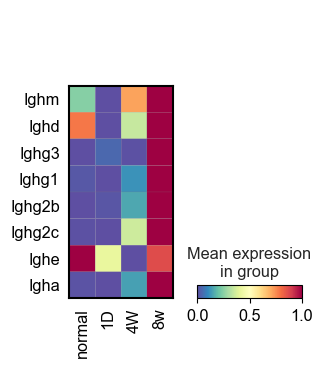

In [301]:
c = ['Ighm',
     'Ighd',
     'Ighg3',    
     'Ighg1',
     'Ighg2b',
     'Ighg2c',
     'Ighe',
     'Igha',]
sc.pl.matrixplot(adata, groupby='time', var_names=c, cmap='Spectral_r', standard_scale='var', swap_axes=True, save='igc.pdf')

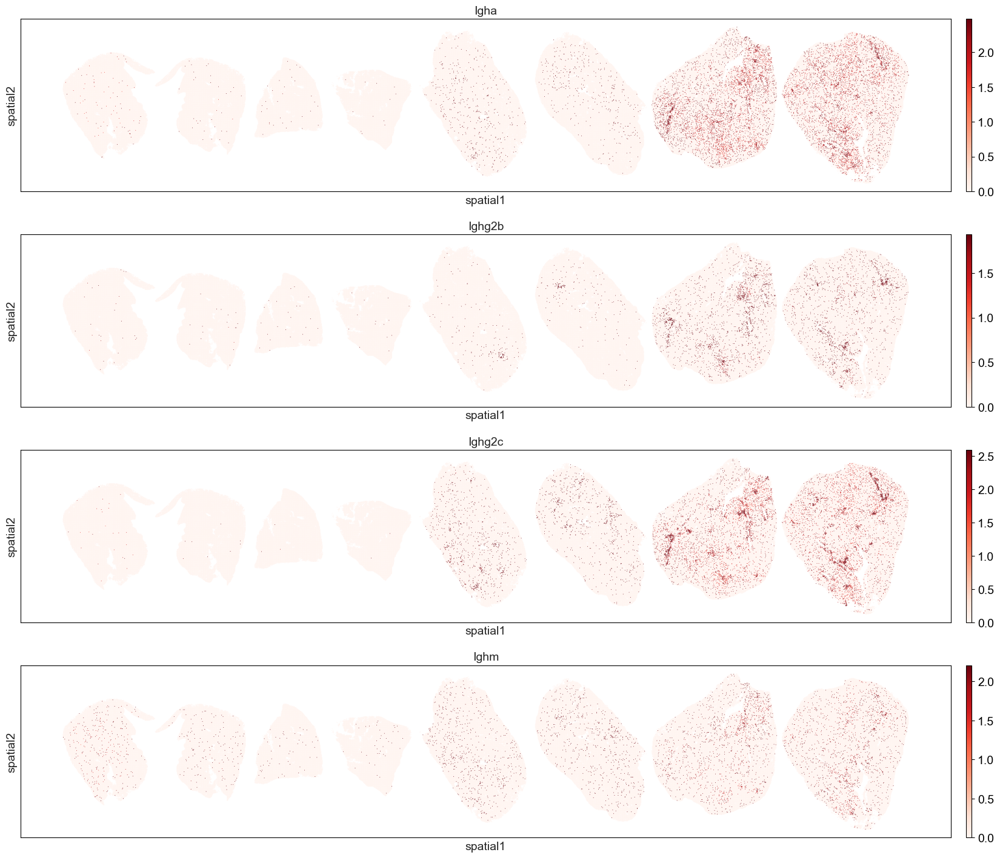

In [296]:
c = ['Igha',
     'Ighg2b',
     'Ighg2c',
     'Ighm']
with rc_context(rc={'figure.figsize': (30, 4)}):
    sc.pl.spatial(adata, color=c, spot_size=60, vmax='p99', cmap='Reds', ncols=1, save='igc.pdf')